In [1]:
import torch
import sys
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import scanpy as sc
import scvi

Global seed set to 0


In [2]:
sc.set_figure_params(figsize=(8, 8))

In [3]:
## Load data
que_adata=sc.read_h5ad('/lorien/pgf/rdata/human_v1/integrated/STEP07.merged.clean_cbn.ann.h5ad')

In [4]:
# que_adata.var.rename(columns = {'_index':'XXX'}, inplace = True) ## bug workaround

In [5]:
que_adata

AnnData object with n_obs × n_vars = 117500 × 30524
    obs: 'sample', 'orig.name', 'study', 'method', 'platform', 'protocol', 'data_process', 'tissue', 'enrichment', 'preparation', 'diagnosis', 'sex_recipient', 'age_recipient', 'sex_donor', 'age_donor', 'duration', 'recipient', 'replicate', 'name', 'name2', 'S.Score', 'G2M.Score', 'Phase', 'nCount_CBN', 'nFeature_CBN', 'pct_mito_CBN', 'nCount_SCT', 'nFeature_SCT', 'pct_mito_SCT', 'Doublet_SC', 'Doublet_SC_score'
    var: 'features'

In [6]:
ref_adata=sc.read_h5ad('/lorien/pgf/rdata/global_raw.h5ad') ## Full Teichmann data

In [7]:
ref_adata

AnnData object with n_obs × n_vars = 486134 × 33538
    obs: 'NRP', 'age_group', 'cell_source', 'cell_type', 'donor', 'gender', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'source', 'type', 'version', 'cell_states', 'Used'
    var: 'gene_ids-Harvard-Nuclei', 'feature_types-Harvard-Nuclei', 'gene_ids-Sanger-Nuclei', 'feature_types-Sanger-Nuclei', 'gene_ids-Sanger-Cells', 'feature_types-Sanger-Cells', 'gene_ids-Sanger-CD45', 'feature_types-Sanger-CD45'
    uns: 'cell_type_colors'
    obsm: 'X_pca', 'X_umap'

In [8]:
que_adata.obs["scanvi_batch"] = "Que"
ref_adata.obs["scanvi_batch"] = "Ref"

In [9]:
que_adata.shape, ref_adata.shape

((117500, 30524), (486134, 33538))

In [10]:
## Check reference labels

np.unique(ref_adata.obs["cell_type"], return_counts = True)

(array(['Adipocytes', 'Atrial_Cardiomyocyte', 'Endothelial', 'Fibroblast',
        'Lymphoid', 'Mesothelial', 'Myeloid', 'Neuronal', 'NotAssigned',
        'Pericytes', 'Smooth_muscle_cells', 'Ventricular_Cardiomyocyte',
        'doublets'], dtype=object),
 array([  3799,  23483, 100579,  59341,  17217,    718,  23028,   3961,
         33998,  77856,  16242, 125289,    623]))

In [11]:
np.unique(ref_adata.obs["cell_states"], return_counts = True)

(array(['Adip1', 'Adip2', 'Adip3', 'Adip4', 'B_cells', 'CD14+Mo',
        'CD16+Mo', 'CD4+T_cytox', 'CD4+T_tem', 'CD8+T_cytox', 'CD8+T_tem',
        'DC', 'DOCK4+MØ1', 'DOCK4+MØ2', 'EC10_CMC-like', 'EC1_cap',
        'EC2_cap', 'EC3_cap', 'EC4_immune', 'EC5_art', 'EC6_ven',
        'EC7_atria', 'EC8_ln', 'EC9_FB-like', 'FB1', 'FB2', 'FB3', 'FB4',
        'FB5', 'FB6', 'FB7', 'IL17RA+Mo', 'LYVE1+MØ1', 'LYVE1+MØ2',
        'LYVE1+MØ3', 'Mast', 'Meso', 'Mo_pi', 'MØ_AgP', 'MØ_mod', 'NC1',
        'NC2', 'NC3', 'NC4', 'NC5', 'NC6', 'NK', 'NKT', 'NØ', 'PC1_vent',
        'PC2_atria', 'PC3_str', 'PC4_CMC-like', 'SMC1_basic', 'SMC2_art',
        'aCM1', 'aCM2', 'aCM3', 'aCM4', 'aCM5', 'doublets', 'nan', 'vCM1',
        'vCM2', 'vCM3', 'vCM4', 'vCM5'], dtype=object),
 array([ 2274,   991,   290,   244,  1195,  1883,  3278,  3113,  1047,
         2956,  3001,   814,  3239,  1626,  2608, 27417, 13445, 16897,
         5637, 20317,  8486,  4485,   754,   533, 26632, 13779,  7744,
         6146,  25

In [12]:
np.unique(ref_adata.obs["Used"], return_counts = True)

(array(['No', 'Yes'], dtype=object), array([ 33998, 452136]))

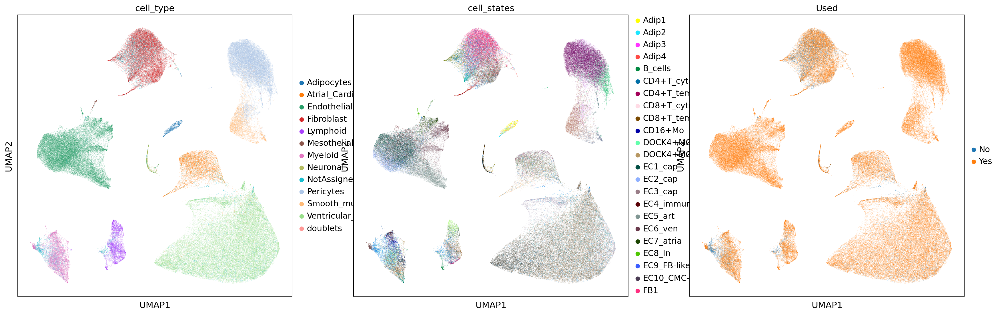

In [13]:
sc.pl.umap(ref_adata, color=['cell_type', 'cell_states', 'Used'])

In [14]:
## Cleanup reference
ref_adata=ref_adata[(ref_adata.obs["Used"]=='Yes') & 
                    (ref_adata.obs["cell_type"]!='doublets') &
                    (ref_adata.obs["cell_states"]!='nan')]

In [15]:
ref_adata.obs["nCount_CBN"]=ref_adata.obs["n_counts"]
ref_adata.obs["nFeature_CBN"]=ref_adata.obs["n_genes"]
ref_adata.obs["pct_mito_CBN"]=ref_adata.obs["percent_mito"]

/tmp/ipykernel_1304762/1436284810.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ref_adata.obs["nCount_CBN"]=ref_adata.obs["n_counts"]


In [16]:
ref_adata.shape

(451513, 33538)

In [17]:
## Dataset concatenation and HVG selection

adata = que_adata.concatenate(ref_adata)
adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata  # keep full dimension safe

/home/xli/.conda/envs/scvi/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


In [18]:
sc.pp.highly_variable_genes(
    adata,
    flavor="seurat_v3",
    n_top_genes=3000,
    layer="counts",
    batch_key="scanvi_batch",
    subset=True
)

In [19]:
adata

AnnData object with n_obs × n_vars = 569013 × 3000
    obs: 'sample', 'orig.name', 'study', 'method', 'platform', 'protocol', 'data_process', 'tissue', 'enrichment', 'preparation', 'diagnosis', 'sex_recipient', 'age_recipient', 'sex_donor', 'age_donor', 'duration', 'recipient', 'replicate', 'name', 'name2', 'S.Score', 'G2M.Score', 'Phase', 'nCount_CBN', 'nFeature_CBN', 'pct_mito_CBN', 'nCount_SCT', 'nFeature_SCT', 'pct_mito_SCT', 'Doublet_SC', 'Doublet_SC_score', 'scanvi_batch', 'NRP', 'age_group', 'cell_source', 'cell_type', 'donor', 'gender', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'source', 'type', 'version', 'cell_states', 'Used', 'batch'
    var: 'features-0', 'gene_ids-Harvard-Nuclei-1', 'feature_types-Harvard-Nuclei-1', 'gene_ids-Sanger-Nuclei-1', 'feature_types-Sanger-Nuclei-1', 'gene_ids-Sanger-Cells-1', 'feature_types-Sanger-Cells-1', 'gene_ids-Sanger-CD45-1', 'feature_types-Sanger-CD45-1', 'highly_variable', 'highly_variable_rank', 

In [20]:
## Save temp file
adata.write_h5ad(filename='/lorien/pgf/rdata/human_v1/integrated/STEP08.scanvi_integration.TMP.h5ad')

In [ ]:
## Integration with scVI
scvi.model.SCVI.setup_anndata(adata, 
                              layer="counts",
                              batch_key="scanvi_batch", 
                              categorical_covariate_keys=["sample"],
                              continuous_covariate_keys=["nCount_CBN", "nFeature_CBN", "pct_mito_CBN"])

In [ ]:
vae = scvi.model.SCVI(adata, n_layers=2, n_latent=30)
scvi.data.view_anndata_setup(vae.adata)

In [ ]:
vae.train(max_epochs = 400)

In [ ]:
vae.save("/lorien/pgf/rdata/human_v1/integrated/STEP08.scvi_integration_model")

In [21]:
## Load saved model
vae = scvi.model.SCVI.load("/lorien/pgf/rdata/human_v1/integrated/STEP08.scvi_integration_model",
                           adata,
                           use_gpu=True)

INFO     File /lorien/pgf/rdata/human_v1/integrated/STEP08.scvi_integration_model/model.pt   
         already downloaded                                                                  


In [22]:
adata.obsm["X_scVI"] = vae.get_latent_representation()

In [23]:
adata.layers["scvi_normalized"] = vae.get_normalized_expression(library_size=10e4)

In [24]:
# run PCA then generate UMAP plots
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=20)
sc.tl.umap(adata, min_dist=0.3)
adata.obsm['X_pcaumap']=adata.obsm['X_umap']

In [25]:
# use scVI latent space for UMAP generation
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata, min_dist=0.3)
adata.obsm['X_scVIumap']=adata.obsm['X_umap']

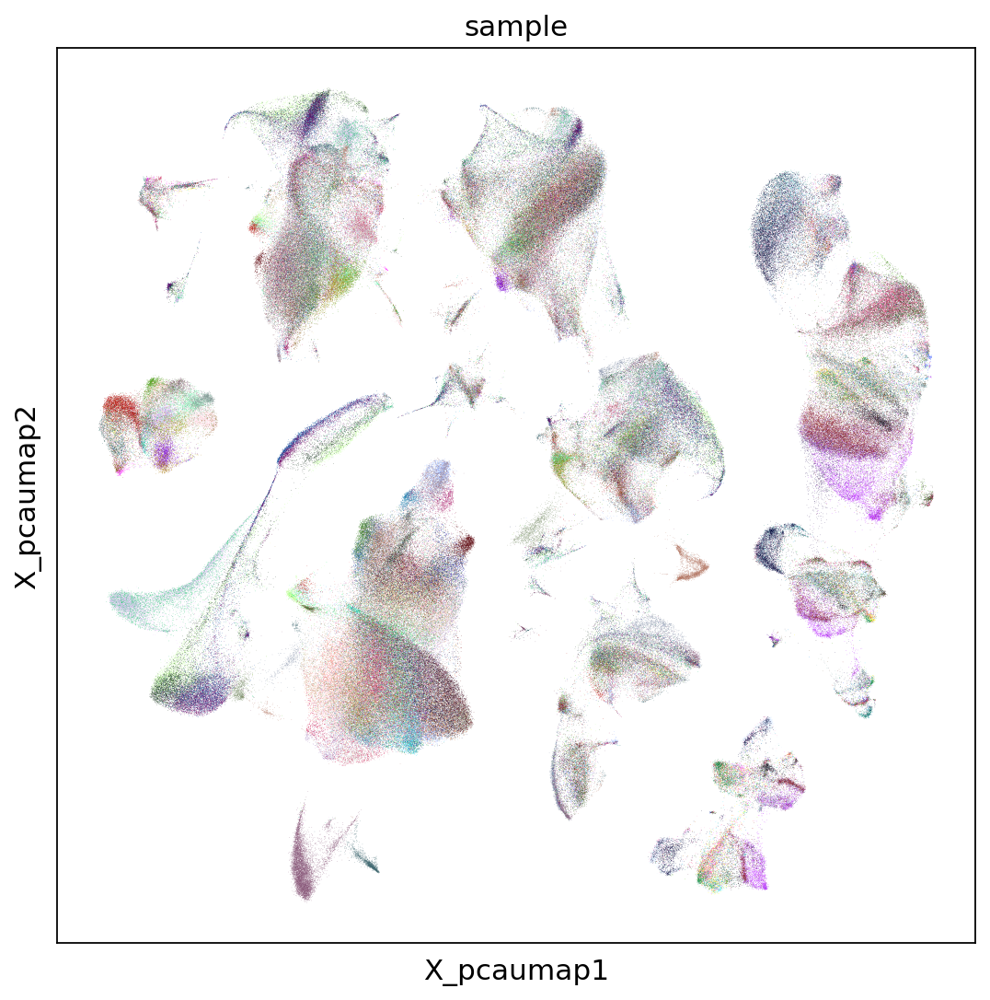

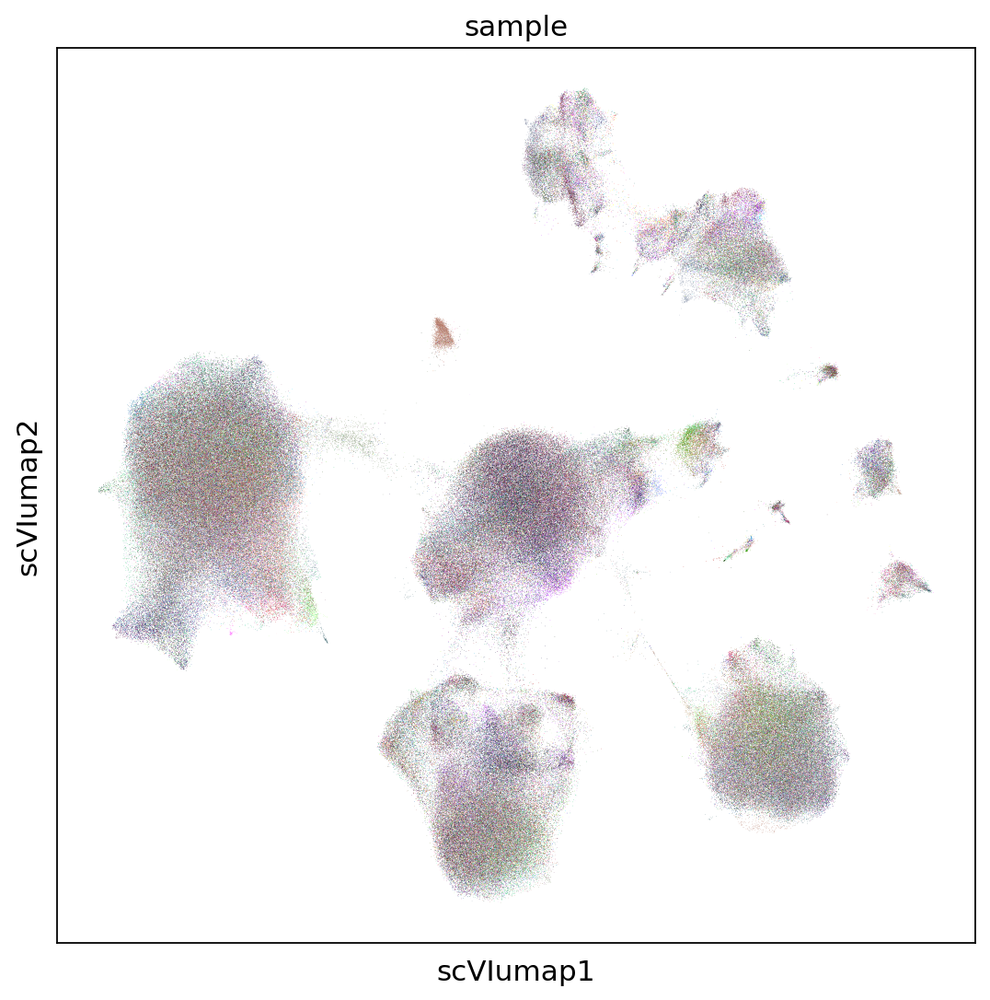

In [26]:
sc.pl.embedding(
    adata, 
    palette=sc.pl.palettes.default_102,
    basis='X_pcaumap',
    legend_loc=None,
    color=["sample"]
)
sc.pl.embedding(
    adata, 
    palette=sc.pl.palettes.default_102,
    basis='scVIumap',
    legend_loc=None,
    color=["sample"]
)

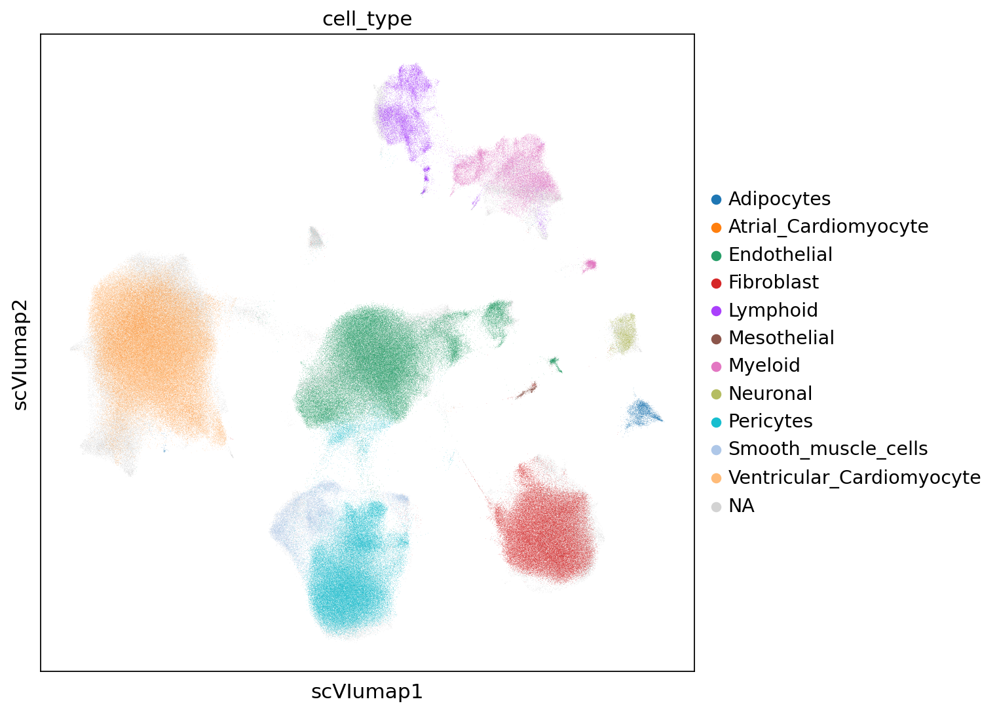

In [27]:
sc.pl.embedding(
    adata, 
    palette=sc.pl.palettes.default_20,
    basis='scVIumap',
    add_outline=False, 
    #legend_loc='on data',
    #legend_fontoutline=2,
    #legend_loc=None,
    color=["cell_type"]
)

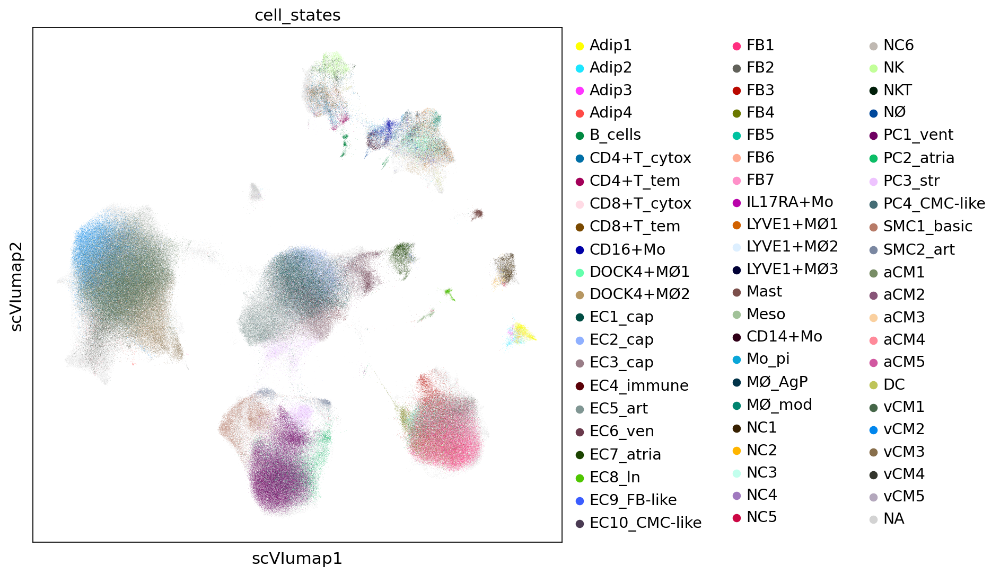

In [28]:
sc.pl.embedding(
    adata, 
    palette=sc.pl.palettes.default_102,
    basis='scVIumap',
    add_outline=False, 
    #legend_loc='on data',
    #legend_fontoutline=2,
    #legend_loc=None,
    color=["cell_states"]
)

In [33]:
## Clustering the neighborhood graph
sc.tl.leiden(adata, resolution = 1.5, key_added = 'Cluster_leiden_res1.5', )
sc.tl.leiden(adata, resolution = 1, key_added = 'Cluster_leiden_res1.0')
sc.tl.leiden(adata, resolution = 0.8, key_added = 'Cluster_leiden_res0.8')
sc.tl.leiden(adata, resolution = 0.5, key_added = 'Cluster_leiden_res0.5')
sc.tl.leiden(adata, resolution = 0.2, key_added = 'Cluster_leiden_res0.2')

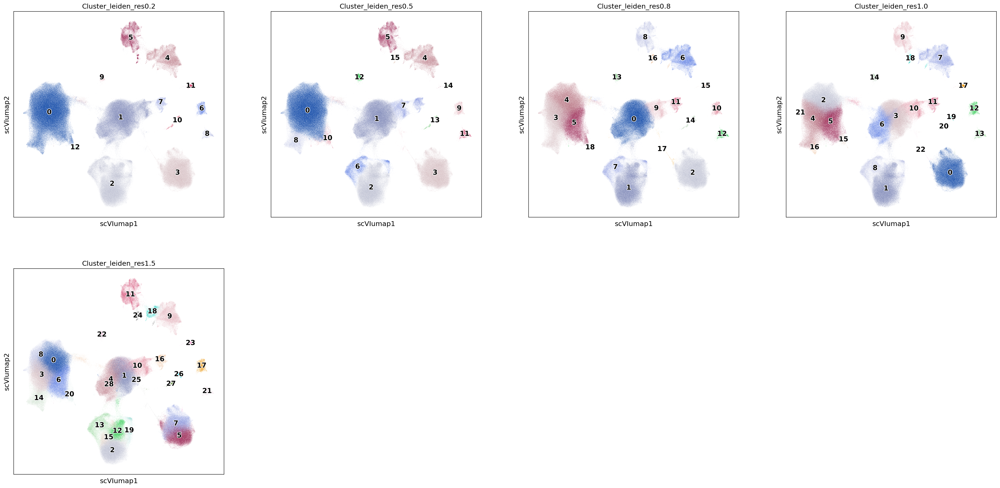

In [35]:
sc.pl.embedding(
    adata, 
    palette=sc.pl.palettes.default_28,
    add_outline=False, 
    legend_loc='on data',
    legend_fontoutline=2,
    basis='scVIumap',
    color=['Cluster_leiden_res0.2',
           'Cluster_leiden_res0.5', 
           'Cluster_leiden_res0.8', 
           'Cluster_leiden_res1.0',
           'Cluster_leiden_res1.5']
)

In [36]:
## Save temp file
adata.write_h5ad(filename='/lorien/pgf/rdata/human_v1/integrated/STEP08.scanvi_integration.TMP.h5ad')

In [29]:
## Transfer of annotations with scANVI for cell types

adata.obs["celltype_scanvi"] = 'Unknown'
ref_mask = adata.obs['scanvi_batch'] == "Ref"
adata.obs["celltype_scanvi"][ref_mask] = adata.obs.cell_type[ref_mask].values

/tmp/ipykernel_1304762/130776851.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["celltype_scanvi"][ref_mask] = adata.obs.cell_type[ref_mask].values


In [30]:
np.unique(adata.obs["celltype_scanvi"], return_counts = True)

(array(['Adipocytes', 'Atrial_Cardiomyocyte', 'Endothelial', 'Fibroblast',
        'Lymphoid', 'Mesothelial', 'Myeloid', 'Neuronal', 'Pericytes',
        'Smooth_muscle_cells', 'Unknown', 'Ventricular_Cardiomyocyte'],
       dtype=object),
 array([  3799,  23483, 100579,  59341,  17217,    718,  23028,   3961,
         77856,  16242, 117500, 125289]))

In [ ]:
## register the AnnData object and run scANVI

scvi.model.SCANVI.setup_anndata(
    adata,
    unlabeled_category='Unknown',
    layer="counts",
    batch_key="scanvi_batch",
    labels_key="celltype_scanvi",
    categorical_covariate_keys=["sample"],
    continuous_covariate_keys=["nCount_CBN", "nFeature_CBN", "pct_mito_CBN"]
)

In [ ]:
lvae = scvi.model.SCANVI.from_scvi_model(scvi_model=vae, 
                                         unlabeled_category="Unknown", 
                                         adata=adata, 
                                         labels_key="celltype_scanvi")

In [ ]:
lvae.train(max_epochs=20, n_samples_per_label=100)

In [ ]:
lvae.save("/lorien/pgf/rdata/human_v1/integrated/STEP08.scanvi_integration_model_celltype")

In [37]:
## Load saved model
lvae = scvi.model.SCANVI.load("/lorien/pgf/rdata/human_v1/integrated/STEP08.scanvi_integration_model_celltype",
                              adata,
                              use_gpu=True)

INFO     File /lorien/pgf/rdata/human_v1/integrated/STEP08.scanvi_integration_model_celltype/
         model.pt already downloaded                                                         


In [38]:
adata.obs["scANVI_predict_celltype"] = lvae.predict(adata)
adata.obsm["X_scANVI"] = lvae.get_latent_representation(adata)

In [39]:
sc.pp.neighbors(adata, use_rep="X_scANVI")
sc.tl.umap(adata)
adata.obsm['X_scANVIumap']=adata.obsm['X_umap']

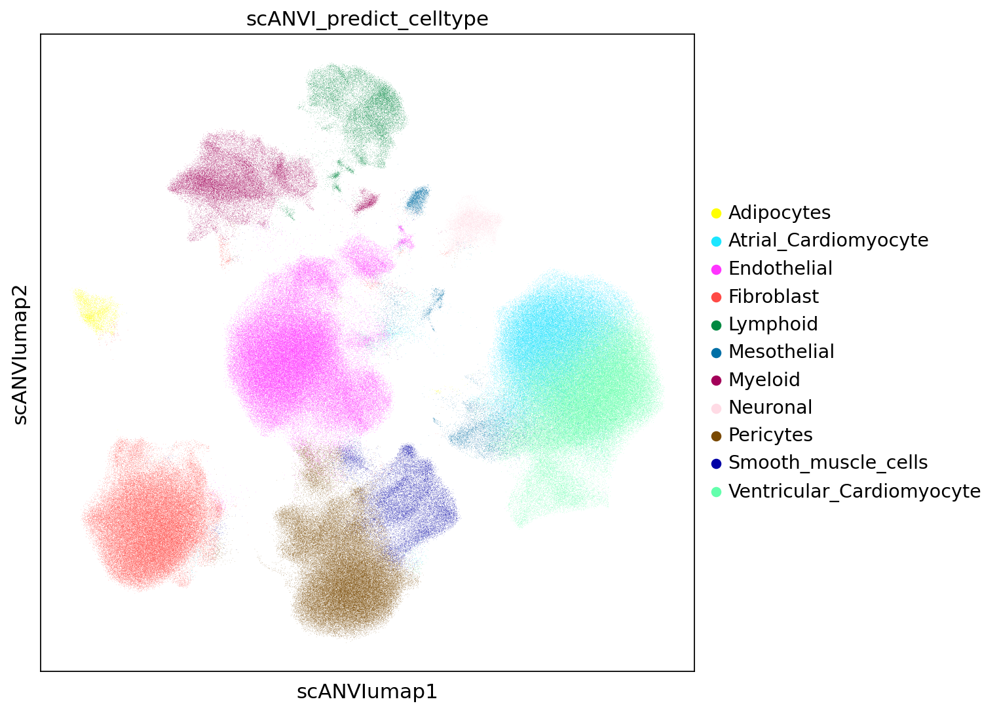

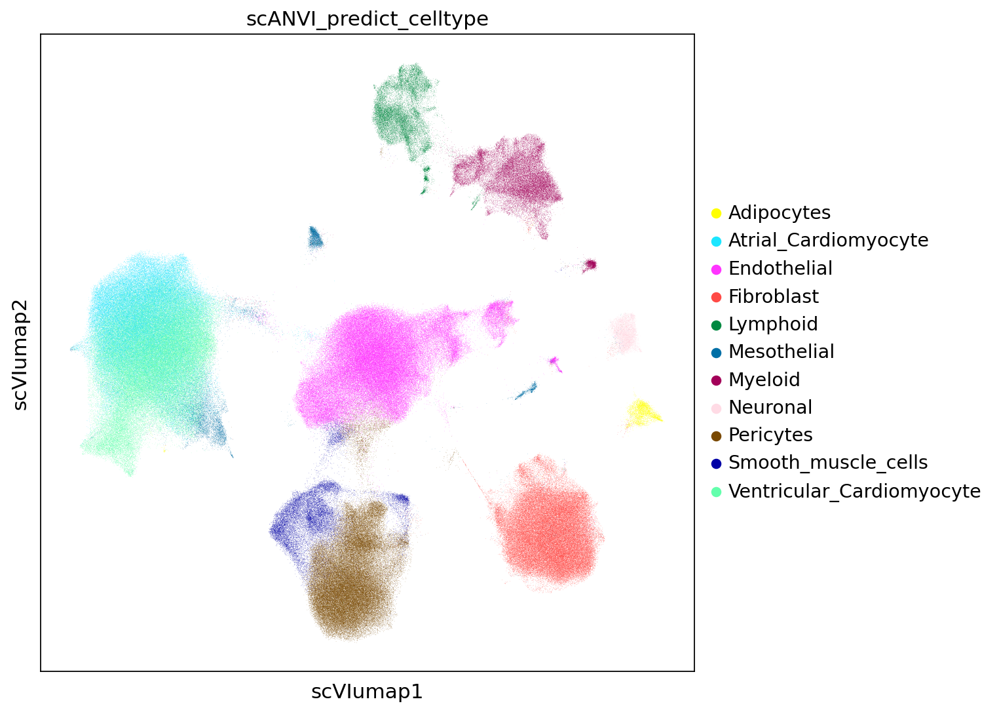

In [40]:
sc.pl.embedding(
    adata, 
    palette=sc.pl.palettes.default_102,
    basis='scANVIumap',
    add_outline=False, 
    #legend_loc='on data',
    #legend_fontoutline=2,
    #legend_loc=None,
    color=["scANVI_predict_celltype"]
)
sc.pl.embedding(
    adata, 
    palette=sc.pl.palettes.default_102,
    basis='scVIumap',
    add_outline=False, 
    #legend_loc='on data',
    #legend_fontoutline=2,
    #legend_loc=None,
    color=["scANVI_predict_celltype"]
)

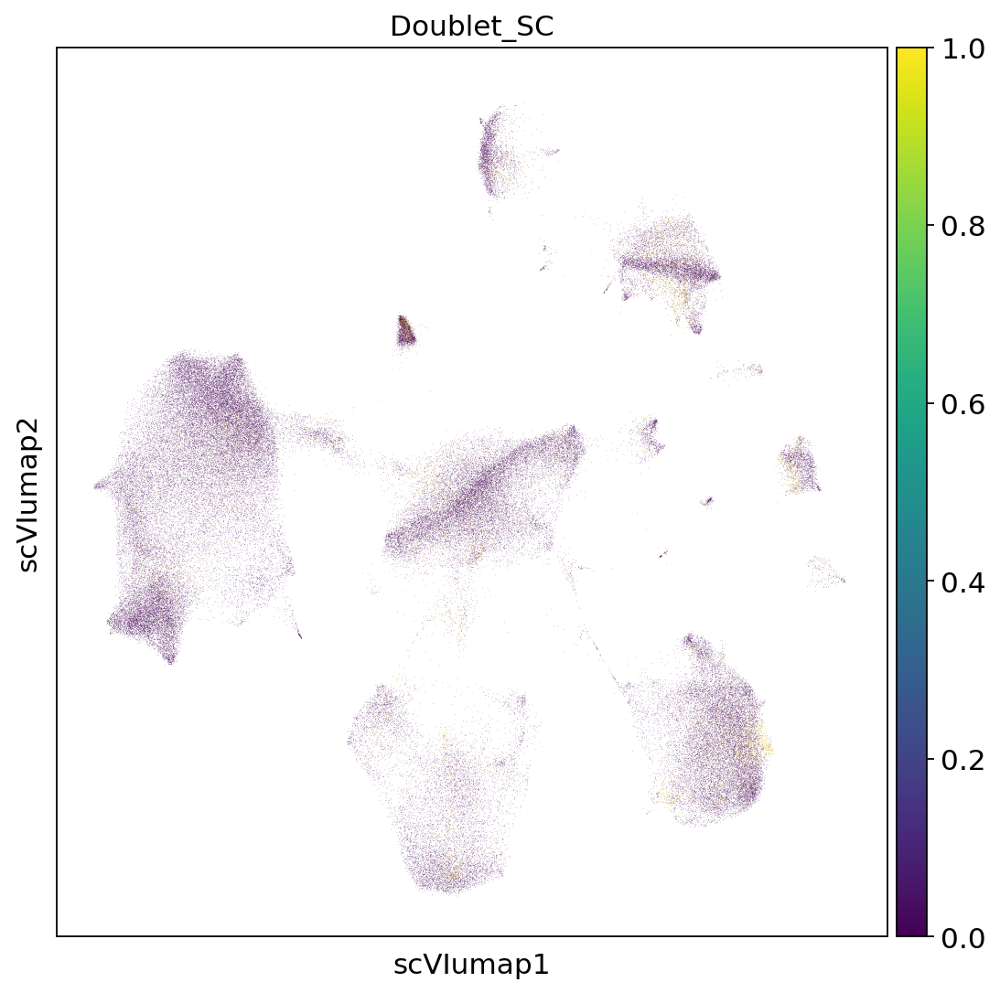

In [41]:
sc.pl.embedding(
    adata, 
    palette=sc.pl.palettes.vega_10, 
    na_color='white',
    basis='scVIumap',
    color=["Doublet_SC"]
)

In [42]:
## Transfer of annotations with scANVI for cell states

adata.obs["cellstate_scanvi"] = 'Unknown'
ref_mask = adata.obs['scanvi_batch'] == "Ref"
adata.obs["cellstate_scanvi"][ref_mask] = adata.obs.cell_states[ref_mask].values

/tmp/ipykernel_1304762/2071998366.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["cellstate_scanvi"][ref_mask] = adata.obs.cell_states[ref_mask].values


In [43]:
np.unique(adata.obs["cellstate_scanvi"], return_counts = True)

(array(['Adip1', 'Adip2', 'Adip3', 'Adip4', 'B_cells', 'CD14+Mo',
        'CD16+Mo', 'CD4+T_cytox', 'CD4+T_tem', 'CD8+T_cytox', 'CD8+T_tem',
        'DC', 'DOCK4+MØ1', 'DOCK4+MØ2', 'EC10_CMC-like', 'EC1_cap',
        'EC2_cap', 'EC3_cap', 'EC4_immune', 'EC5_art', 'EC6_ven',
        'EC7_atria', 'EC8_ln', 'EC9_FB-like', 'FB1', 'FB2', 'FB3', 'FB4',
        'FB5', 'FB6', 'FB7', 'IL17RA+Mo', 'LYVE1+MØ1', 'LYVE1+MØ2',
        'LYVE1+MØ3', 'Mast', 'Meso', 'Mo_pi', 'MØ_AgP', 'MØ_mod', 'NC1',
        'NC2', 'NC3', 'NC4', 'NC5', 'NC6', 'NK', 'NKT', 'NØ', 'PC1_vent',
        'PC2_atria', 'PC3_str', 'PC4_CMC-like', 'SMC1_basic', 'SMC2_art',
        'Unknown', 'aCM1', 'aCM2', 'aCM3', 'aCM4', 'aCM5', 'vCM1', 'vCM2',
        'vCM3', 'vCM4', 'vCM5'], dtype=object),
 array([  2274,    991,    290,    244,   1195,   1883,   3278,   3113,
          1047,   2956,   3001,    814,   3239,   1626,   2608,  27417,
         13445,  16897,   5637,  20317,   8486,   4485,    754,    533,
         26632,  13779,

In [ ]:
## register the AnnData object and run scANVI

scvi.model.SCANVI.setup_anndata(
    adata,
    unlabeled_category='Unknown',
    layer="counts",
    batch_key="scanvi_batch",
    labels_key="cellstate_scanvi",
    categorical_covariate_keys=["sample"],
    continuous_covariate_keys=["nCount_CBN", "nFeature_CBN", "pct_mito_CBN"]
)

In [ ]:
lvae = scvi.model.SCANVI.from_scvi_model(vae, "Unknown", adata=adata, labels_key="cellstate_scanvi")

In [ ]:
lvae.train(max_epochs=20, n_samples_per_label=100)

In [ ]:
lvae.save("/lorien/pgf/rdata/human_v1/integrated/STEP08.scanvi_integration_model_cellstate")

In [44]:
## Load saved model
lvae = scvi.model.SCANVI.load("/lorien/pgf/rdata/human_v1/integrated/STEP08.scanvi_integration_model_cellstate",
                              adata,
                              use_gpu=True)

INFO     File /lorien/pgf/rdata/human_v1/integrated/STEP08.scanvi_integration_model_cellstate
         /model.pt already downloaded                                                        


In [45]:
adata.obs["scANVI_predict_cellstate"] = lvae.predict(adata)

In [46]:
adata.obs[adata.obs['scanvi_batch'] == "Que"]

,sample,orig.name,study,method,platform,protocol,data_process,tissue,enrichment,preparation,...,_scvi_labels,celltype_scanvi,Cluster_leiden_res1.5,Cluster_leiden_res1.0,Cluster_leiden_res0.8,Cluster_leiden_res0.5,Cluster_leiden_res0.2,scANVI_predict_celltype,cellstate_scanvi,scANVI_predict_cellstate
2022_Unpub2_DTuraga:P3_S001:AAACCCAAGCCACAAG-1-0,P3_S001,AAACCCAAGCCACAAG-1,2022_Unpub2_DTuraga,Nucleus,10X,GEM_3p_v3,CellBender,Left_ventricle,All_cells,FACS_nucleus_isolation,...,65,Unknown,5,0,2,3,3,Fibroblast,Unknown,NC2
2022_Unpub2_DTuraga:P3_S001:AAACCCAAGGGACTGT-1-0,P3_S001,AAACCCAAGGGACTGT-1,2022_Unpub2_DTuraga,Nucleus,10X,GEM_3p_v3,CellBender,Left_ventricle,All_cells,FACS_nucleus_isolation,...,65,Unknown,9,7,6,4,4,Myeloid,Unknown,MØ_AgP
2022_Unpub2_DTuraga:P3_S001:AAACCCAAGGGATCAC-1-0,P3_S001,AAACCCAAGGGATCAC-1,2022_Unpub2_DTuraga,Nucleus,10X,GEM_3p_v3,CellBender,Left_ventricle,All_cells,FACS_nucleus_isolation,...,65,Unknown,9,7,6,4,4,Myeloid,Unknown,DOCK4+MØ2
2022_Unpub2_DTuraga:P3_S001:AAACCCACAAATAGCA-1-0,P3_S001,AAACCCACAAATAGCA-1,2022_Unpub2_DTuraga,Nucleus,10X,GEM_3p_v3,CellBender,Left_ventricle,All_cells,FACS_nucleus_isolation,...,65,Unknown,11,9,8,5,5,Lymphoid,Unknown,CD8+T_cytox
2022_Unpub2_DTuraga:P3_S001:AAACCCACAACCGATT-1-0,P3_S001,AAACCCACAACCGATT-1,2022_Unpub2_DTuraga,Nucleus,10X,GEM_3p_v3,CellBender,Left_ventricle,All_cells,FACS_nucleus_isolation,...,65,Unknown,9,7,6,4,4,Myeloid,Unknown,DOCK4+MØ2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021_Circulation_EPorrello:P2_S002:TTTGTTGAGGGCCAAT-1-0,P2_S002,TTTGTTGAGGGCCAAT-1,2021_Circulation_EPorrello,Nucleus,10X,GEM_3p_v3,CellBender,Left_ventricle,All_cells,Unknown,...,65,Unknown,22,14,13,12,9,Mesothelial,Unknown,Adip4
2021_Circulation_EPorrello:P2_S002:TTTGTTGAGTTATGGA-1-0,P2_S002,TTTGTTGAGTTATGGA-1,2021_Circulation_EPorrello,Nucleus,10X,GEM_3p_v3,CellBender,Left_ventricle,All_cells,Unknown,...,65,Unknown,22,14,13,12,9,Mesothelial,Unknown,LYVE1+MØ2
2021_Circulation_EPorrello:P2_S002:TTTGTTGCACCGAATT-1-0,P2_S002,TTTGTTGCACCGAATT-1,2021_Circulation_EPorrello,Nucleus,10X,GEM_3p_v3,CellBender,Left_ventricle,All_cells,Unknown,...,65,Unknown,22,14,13,12,9,Mesothelial,Unknown,LYVE1+MØ2
2021_Circulation_EPorrello:P2_S002:TTTGTTGCATATGCGT-1-0,P2_S002,TTTGTTGCATATGCGT-1,2021_Circulation_EPorrello,Nucleus,10X,GEM_3p_v3,CellBender,Left_ventricle,All_cells,Unknown,...,65,Unknown,11,9,8,5,5,Lymphoid,Unknown,CD8+T_cytox


In [47]:
adata.obs[adata.obs['scanvi_batch'] == "Que"].to_csv('/lorien/pgf/rdata/human_v1/integrated/STEP08.scanvi_integration.obs.csv')

In [48]:
## Check scVI and scANVI umaps for the query data
adata_que = adata[adata.obs['scanvi_batch'] == "Que"]

/home/xli/.conda/envs/scvi/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/xli/.conda/envs/scvi/lib/python3.9/contextlib.py:126: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)
/home/xli/.conda/envs/scvi/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


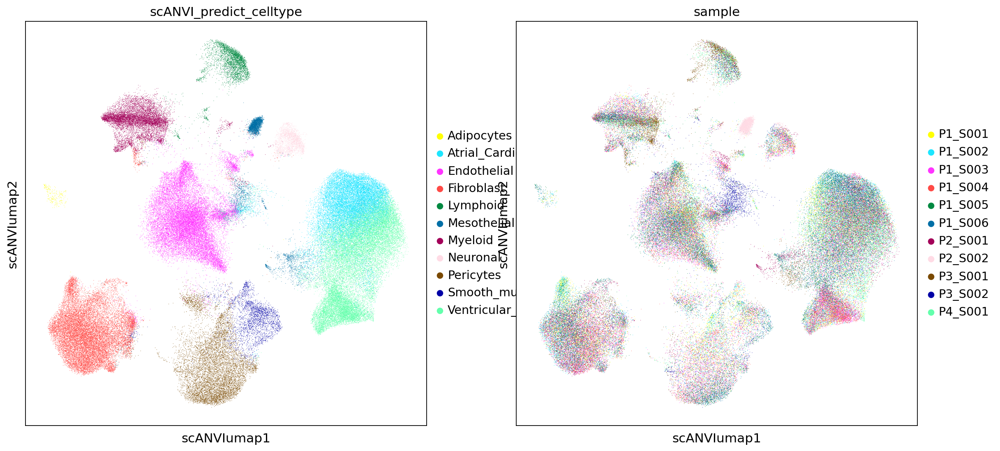

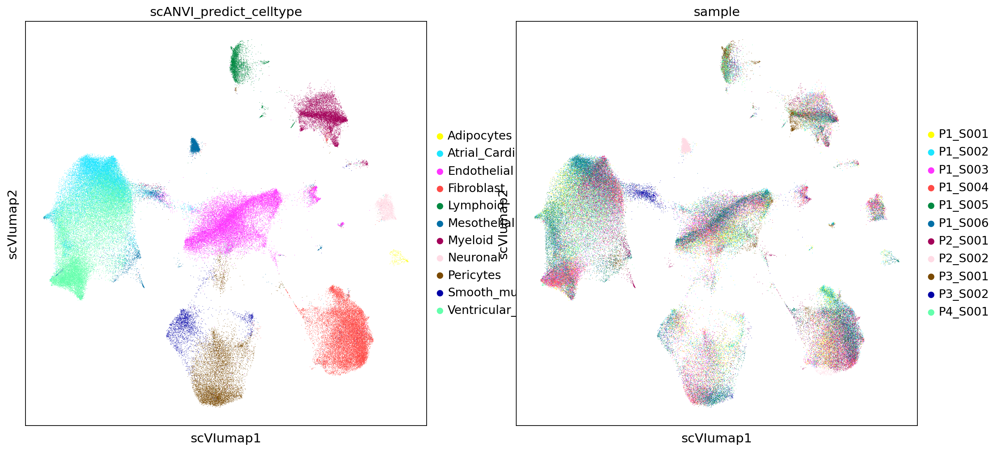

In [49]:
sc.pl.embedding(
    adata_que, 
    palette=sc.pl.palettes.default_102,
    basis='scANVIumap',
    add_outline=False, 
    #legend_loc='on data',
    #legend_fontoutline=2,
    #legend_loc=None,
    color=["scANVI_predict_celltype", "sample"]
)
sc.pl.embedding(
    adata_que, 
    palette=sc.pl.palettes.default_102,
    basis='scVIumap',
    add_outline=False, 
    #legend_loc='on data',
    #legend_fontoutline=2,
    #legend_loc=None,
    color=["scANVI_predict_celltype", "sample"]
)

In [50]:
adata_que.write_h5ad(filename='/lorien/pgf/rdata/human_v1/integrated/STEP08.scanvi_integration.h5ad')

In [ ]:
adata_que=sc.read_h5ad('/lorien/pgf/rdata/human_v1/integrated/STEP08.scanvi_integration.h5ad')

In [ ]:
## in case the h5ad cannot be loaded back into R due to bugs

In [51]:
del adata_que.layers["scvi_normalized"]
del adata_que.layers["counts"]
del adata_que.raw

In [52]:
del adata_que.uns
del adata_que.obsp
del adata_que.varm
del adata_que.var

In [53]:
del adata_que.obsm['X_pca']
del adata_que.obsm['X_pcaumap']
del adata_que.obsm['X_umap']
del adata_que.obsm['_scvi_extra_categorical_covs']
del adata_que.obsm['_scvi_extra_continuous_covs']

In [54]:
adata_que

AnnData object with n_obs × n_vars = 117500 × 3000
    obs: 'sample', 'orig.name', 'study', 'method', 'platform', 'protocol', 'data_process', 'tissue', 'enrichment', 'preparation', 'diagnosis', 'sex_recipient', 'age_recipient', 'sex_donor', 'age_donor', 'duration', 'recipient', 'replicate', 'name', 'name2', 'S.Score', 'G2M.Score', 'Phase', 'nCount_CBN', 'nFeature_CBN', 'pct_mito_CBN', 'nCount_SCT', 'nFeature_SCT', 'pct_mito_SCT', 'Doublet_SC', 'Doublet_SC_score', 'scanvi_batch', 'NRP', 'age_group', 'cell_source', 'cell_type', 'donor', 'gender', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'source', 'type', 'version', 'cell_states', 'Used', 'batch', '_scvi_batch', '_scvi_labels', 'celltype_scanvi', 'Cluster_leiden_res1.5', 'Cluster_leiden_res1.0', 'Cluster_leiden_res0.8', 'Cluster_leiden_res0.5', 'Cluster_leiden_res0.2', 'scANVI_predict_celltype', 'cellstate_scanvi', 'scANVI_predict_cellstate'
    obsm: 'X_scVI', 'X_scVIumap', 'X_scANVI', 'X_scANVIu

In [55]:
adata_que.write_csvs(dirname='/lorien/pgf/rdata/human_v1/integrated/STEP08.scanvi_integration.csvs', 
                     sep=",")

In [ ]:
## The End